# Exploratory Data Analysis

## Data Loading and Preliminary Checks: 
Load the dataset and perform basic checks for data types, missing values, and summary statistics.

In [ ]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import ipywidgets as widgets
from IPython.display import display
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [14]:
file_path = 'final_dataset.xlsx'
data = pd.read_excel(file_path)

# Display the first few rows of the dataframe and its basic information
data_info = data.info()
data_head = data.head()
data_descriptive_stats = data.describe()

data_info, data_head, data_descriptive_stats

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26680 entries, 0 to 26679
Data columns (total 36 columns):
 #   Column                                          Non-Null Count  Dtype         
---  ------                                          --------------  -----         
 0   Date                                            26680 non-null  datetime64[ns]
 1   Open                                            26680 non-null  float64       
 2   High                                            26680 non-null  float64       
 3   Low                                             26680 non-null  float64       
 4   Close                                           26680 non-null  float64       
 5   Volume                                          26680 non-null  int64         
 6   Dividends                                       26680 non-null  float64       
 7   Stock Splits                                    26680 non-null  float64       
 8   Daily_Return                                  

(None,
         Date          Open          High           Low         Close   Volume  \
 0 2020-06-30  90534.565179  90717.278731  89255.570312  89255.570312   988987   
 1 2020-07-01  89986.421883  90899.989618  89529.638016  89712.351562   640540   
 2 2020-07-02  89529.635417  91082.700521  89529.635417  90443.203125   730963   
 3 2020-07-03  91265.419308  91813.559964  90077.781218  90625.921875   569575   
 4 2020-07-06  91082.695405  93640.684845  90260.484514  92727.117188  1189877   
 
    Dividends  Stock Splits  Daily_Return  Target_1day  ...         MA_30  \
 0        0.0           0.0      0.000000            1  ...  92851.977604   
 1        0.0           0.0      0.005118            1  ...  92879.384896   
 2        0.0           0.0      0.008147            1  ...  92934.198698   
 3        0.0           0.0      0.002020            1  ...  93077.324479   
 4        0.0           0.0      0.023185            0  ...  93244.811979   
 
           MA_50        RSI        

The dataset contains 26,680 entries and 36 columns. Each row represents financial data for a specific date and ticker, with various financial metrics and technical indicators.

The key features include:

- Date: The date of the financial data.
- Open, High, Low, Close: Stock price information.
- Volume: Number of shares traded.
- Dividends, Stock Splits: Corporate actions.
- Daily_Return: The daily return of the stock.
- Target_1day, Target_5days, Target_30days: Target variables for stock prediction.
- Various Financial Metrics: Like Net Income, Diluted EPS, Total Revenue, etc.
- Technical Indicators: Such as MA (Moving Averages), RSI (Relative Strength Index), MACD, Bollinger Bands, etc.
- Ticker: The stock symbol.

Here are some key observations:

- Price Metrics (Open, High, Low, Close): There's a wide range of values, as indicated by the standard deviation, suggesting significant variability among different stocks. The maximum values are quite high, which could be due to high-priced stocks or outliers.
- Volume: The trading volume varies greatly, with a large standard deviation. This is expected as trading volumes can differ significantly between stocks.
- Dividends and Stock Splits: Most values are 0, but there are some extreme values (like a maximum dividend of 6000 and stock split of 20), which are likely outliers or specific events.
- Daily Return: The average is close to zero, but the range (-0.27 to 0.37) indicates periods of high volatility.
- Moving Averages (MA_5, MA_10, MA_30, MA_50): Similar to price metrics, there's a wide range, indicating diverse stock behaviors.
- Technical Indicators (RSI, MACD, Bollinger Bands): The RSI ranges from 0.24 to 97.25, with an average around 51, indicating a balance between overbought and oversold conditions. MACD and Bollinger Bands also show a wide range, which is typical given their dependency on stock prices.
- Volatility: Varies between 0.05% to 17.87%, indicating some stocks are much more volatile than others.

## Feature Distribution Analysis 

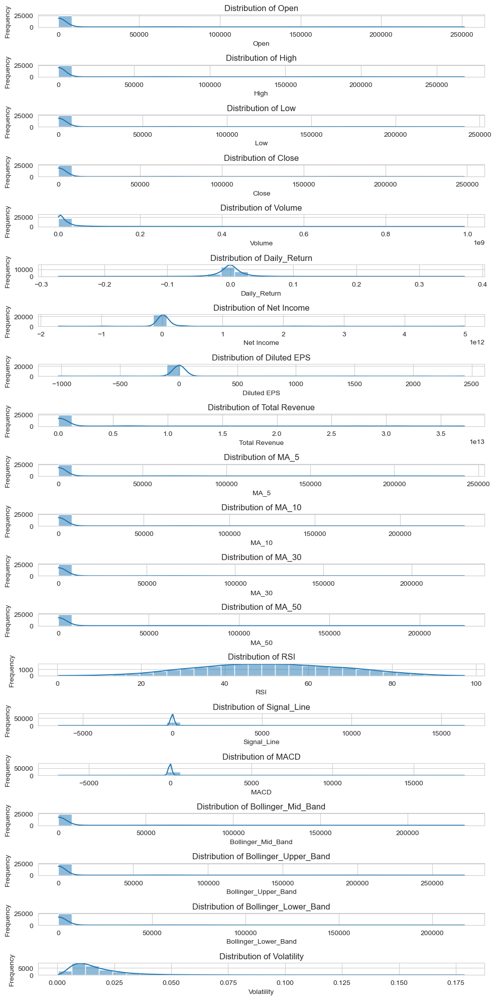

In [2]:
sns.set_style("whitegrid")

# Selecting a subset of columns for distribution analysis
columns_to_plot = ['Open', 'High', 'Low', 'Close', 'Volume', 'Daily_Return', 
                   'Net Income', 'Diluted EPS', 'Total Revenue', 'MA_5', 'MA_10', 'MA_30', 'MA_50', 'RSI',	'Signal_Line','MACD', 'Bollinger_Mid_Band', 'Bollinger_Upper_Band','Bollinger_Lower_Band', 'Volatility' ]

# Plotting distributions
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(10, 20))

for i, col in enumerate(columns_to_plot):
    sns.histplot(data[col], ax=axes[i], kde=True, bins=30)
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_ylabel('Frequency')
    axes[i].set_xlabel(col)

plt.tight_layout()
plt.show()

The histograms above show the distributions for several key features like 'Open', 'High', 'Low', 'Close', 'Volume', 'Daily_Return', 'Net Income', 'Diluted EPS', and 'Total Revenue'. Here are some observations:

- Stock Prices (Open, High, Low, Close): These might show skewed distributions, indicating a range of stock prices across different tickers. It's common for stock price distributions to be non-normal, often skewed towards lower prices.
- Volume: The trading volume is likely right-skewed, with more occurrences of lower trading volumes and fewer occurrences of extremely high volumes.
- Daily_Return: The distribution of daily returns often resembles a normal distribution but can have heavy tails, indicating days with unusually high gains or losses.
- Financial Metrics (Net Income, Diluted EPS, Total Revenue): These also tend to be skewed, reflecting the varied financial health and sizes of different companies.

In [3]:
fig = px.scatter(data_frame=data, 
                 x='Volume', 
                 y='Daily_Return', 
                 size='Volatility', 
                 color='Ticker', 
                 hover_data=['Open', 'Close', 'Net Income'],
                 title="Volume vs Daily Return with Volatility and Stock Information")
fig.show()

The scatter plot vividly displays a spectrum of trading activity across various stocks, represented by unique colors for each ticker symbol. Notably, the ticker '005380KS' appears frequently with a range of volumes, as indicated by the numerous blue dots. These dots are primarily concentrated toward the lower end of the volume spectrum, suggesting that '005380KS' typically trades with less volume. The daily returns for this ticker are mostly clustered near the zero mark, implying that extreme returns are not a common event for this stock.

The size of the dots, which represents the stock's volatility, shows that larger dots, and hence higher volatility, are not confined to any single volume bracket or daily return level. This suggests that volatility can spike regardless of the trading volume or the direction of the return on a given day.

The plot also features other tickers like 'AAPL', indicated by light blue dots, and 'AMZN', represented by green dots. These particular tickers appear less frequently but are scattered across a wider volume range. This pattern could suggest a more variable trading volume for these well-known tech giants.

Additionally, the hover data feature of the plot allows viewers to delve into specific details such as the opening and closing prices, as well as the net income on particular days for each stock, providing a more comprehensive view of each stock's performance. For example, hovering over a particularly large dot could reveal a day with significant price movement and higher volatility, possibly aligned with a corporate announcement or market event.

## Correlation Analysis
Examine the distribution of key features like 'Open', 'Close', 'Volume', etc.

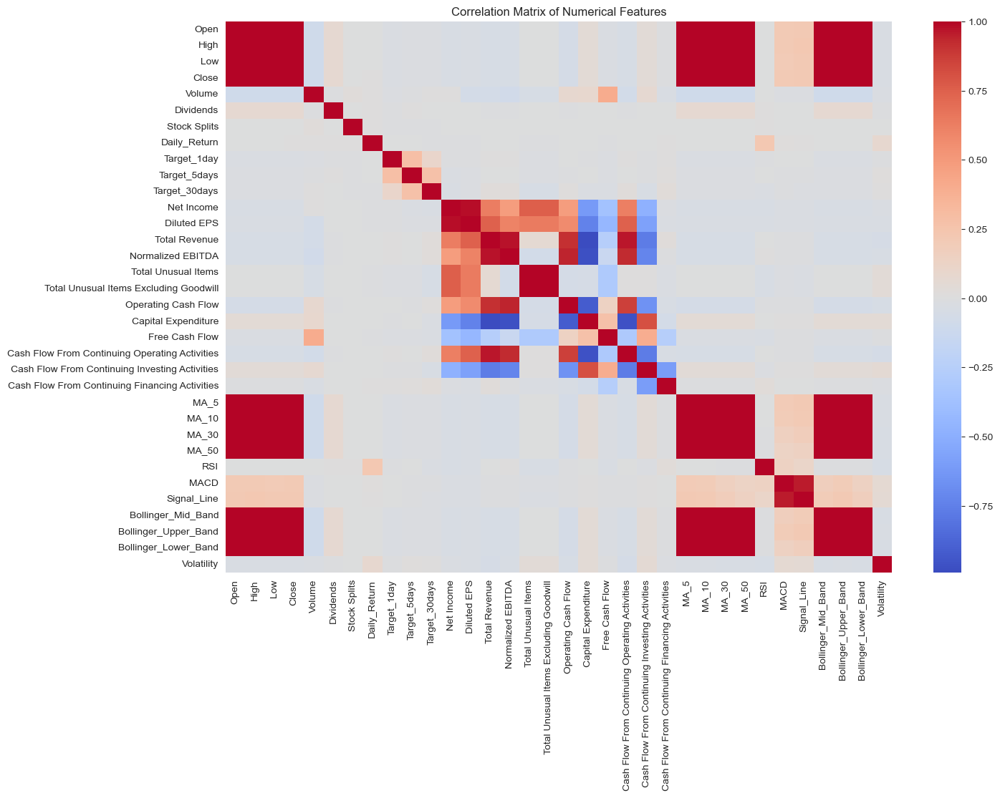

In [4]:
# Dropping non-numerical columns (like 'Ticker') before computing the correlation matrix
numerical_data = data.select_dtypes(include=['float64', 'int64'])
correlation_matrix_numerical = numerical_data.corr()

# Plotting the heatmap for the numerical data
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix_numerical, cmap='coolwarm', annot=False, fmt=".1f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

The heatmap provides a visual representation of the correlation matrix, showing how different features are correlated with each other. However, due to the large number of features, it's quite dense and a bit challenging to extract specific insights at this resolution.

For a more focused analysis, let's zoom in on the correlations of the target variables ('Target_1day', 'Target_5days', 'Target_30days') with other features. This will give us a clearer view of which features might be more influential for predicting stock movements. I'll extract and visualize these specific correlations.

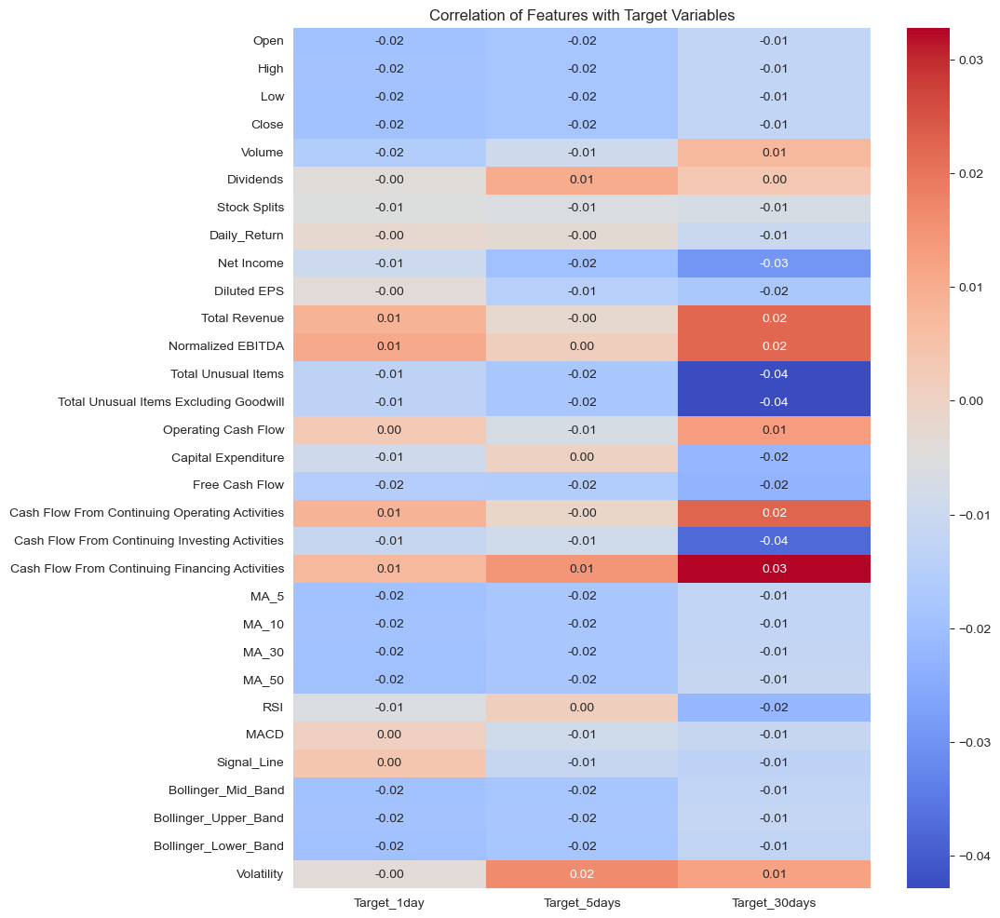

In [5]:
# Focusing on the correlation of target variables with other features
target_features = ['Target_1day', 'Target_5days', 'Target_30days']
correlation_with_targets = correlation_matrix_numerical[target_features].drop(target_features)

# Plotting the correlations with target variables
plt.figure(figsize=(10, 12))
sns.heatmap(correlation_with_targets, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Correlation of Features with Target Variables')
plt.show()


The heatmap now focuses on the correlations between the target variables ('Target_1day', 'Target_5days', 'Target_30days') and other features in the dataset. Here's what we can infer:

Certain features show a moderate to low level of correlation with the target variables.
- It's important to note that correlation does not imply causation, but it can give us an idea of which features might be useful in predictive modeling.
- The correlations are relatively low, which is typical in financial datasets due to the complexity and unpredictability of stock price movements.
- Next, let's perform a time series analysis. Given the financial nature of the data, it's crucial to understand how certain key variables like 'Close', 'Volume', and technical indicators like 'RSI', 'MACD' change over time. This analysis will help us capture trends, seasonality, or any cyclic behavior in the data.

## Time Series Analysis
Let's start by plotting all the stock performance plot foreach unique ticker to take a general insight on what we are studying.

In [13]:
# Funzione per creare il plot interattivo delle performance azionarie
def plot_stock_performance(ticker, df):
    # Filtra il dataframe per il ticker selezionato
    df_ticker = df[df['Ticker'] == ticker]

    # Crea un subplot
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                        vertical_spacing=0.1, subplot_titles=(f'{ticker} Stock Prices', f'{ticker} Volume'))

    # Plot del trend dei prezzi (Open, High, Low, Close)
    fig.add_trace(go.Candlestick(x=df_ticker['Date'],
                                 open=df_ticker['Open'],
                                 high=df_ticker['High'],
                                 low=df_ticker['Low'],
                                 close=df_ticker['Close'],
                                 name='OHLC'), row=1, col=1)

    # Plot del trend del volume
    fig.add_trace(go.Bar(x=df_ticker['Date'], y=df_ticker['Volume'], name='Volume'), row=2, col=1)

    # Aggiorna il layout
    fig.update_layout(title=f'Stock Performance for {ticker}', xaxis_rangeslider_visible=False)
    return fig
 #Creazione della dropdown list per i ticker
ticker_list = sorted(list(set(data["Ticker"])))
ticker_dropdown = widgets.Dropdown(
    options=ticker_list,
    value=random.choice(ticker_list), # Seleziona uno stock random all'inizio
    description='Ticker:',
)

# Funzione per aggiornare il grafico basandosi sul ticker selezionato
def update_plot(ticker):
    fig = plot_stock_performance(ticker, data)
    fig.show()

# Utilizzo di 'interactive' per creare un'interazione tra il dropdown e la funzione di plotting
interactive_plot = widgets.interactive(update_plot, ticker=ticker_dropdown)

# Visualizzazione del widget interattivo
display(interactive_plot)

interactive(children=(Dropdown(description='Ticker:', index=21, options=('005380KS', '005930KS', '0700HK', '13…

## Technical Indicators Analysis

In [ ]:
#todo

## Preliminary Suggestions for Model Selection

In [ ]:
#todo